# Digital Image Processing - Project 2
*Julian Nowaczek*

Setup Environment:

In [1]:
import imageio
import numpy as np
import math
import matplotlib.pyplot as plt
import scipy.misc as misc
import scipy.ndimage
from skimage import feature

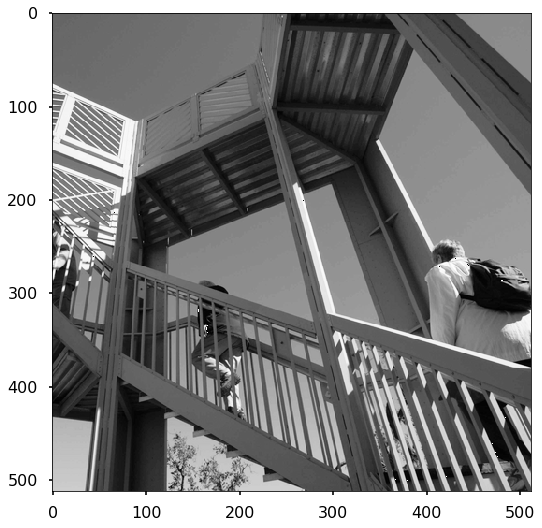

In [2]:
plt.style.use(['seaborn-poster', {'axes.grid': False, 'image.cmap' : 'Greys_r'}])

original = misc.ascent()
plt.imshow(original)
plt.show()

## Question 1

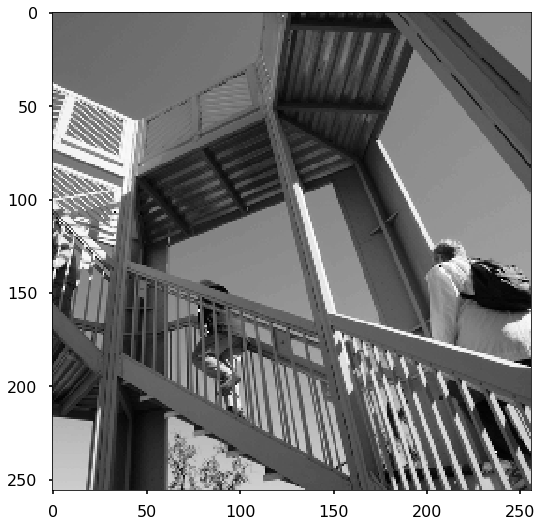

In [3]:
subsample2 = original[::2, ::2]
plt.imshow(subsample2)
plt.show()

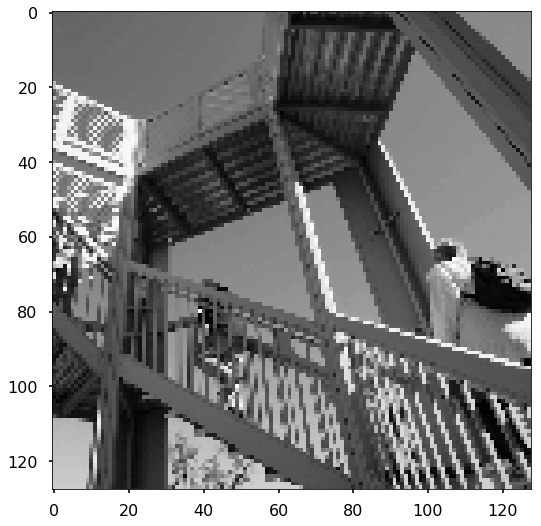

In [4]:
subsample4 = original[::4, ::4]
plt.imshow(subsample4)
plt.show()

## Question 2
### A.

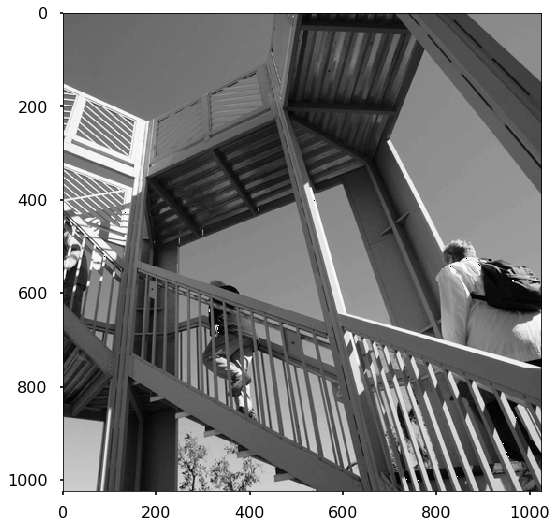

In [5]:
zoom2replication = scipy.ndimage.zoom(original, 2.0, order = 0)
plt.imshow(zoom2replication)
plt.show()

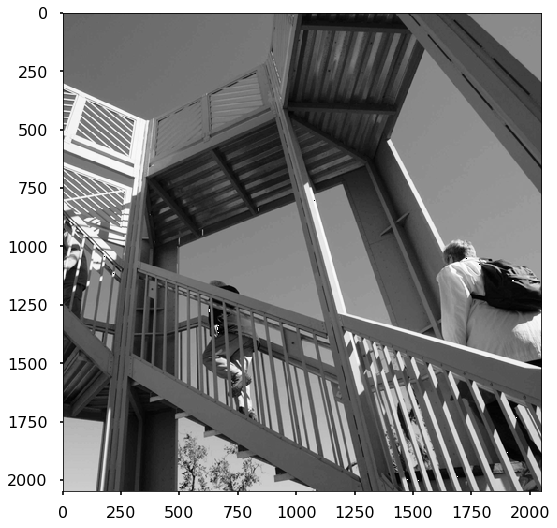

In [6]:
zoom4replication = scipy.ndimage.zoom(original, 4.0, order = 0)
plt.imshow(zoom4replication)
plt.show()

### B.

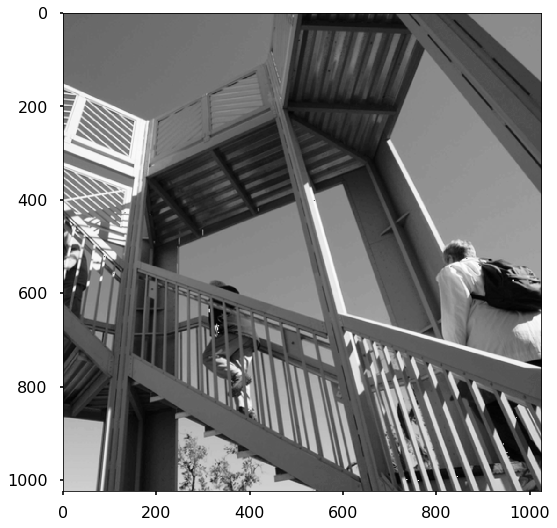

In [7]:
zoom2linear = scipy.ndimage.zoom(original, 2.0, order = 1)
plt.imshow(zoom2linear)
plt.show()

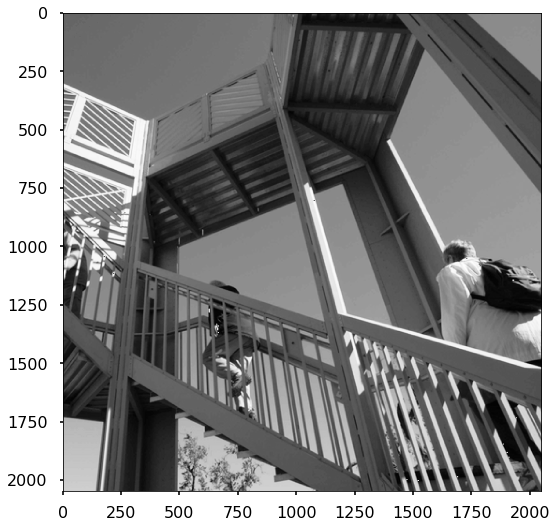

In [8]:
zoom4linear = scipy.ndimage.zoom(original, 4.0, order = 1)
plt.imshow(zoom4linear)
plt.show()

### C.

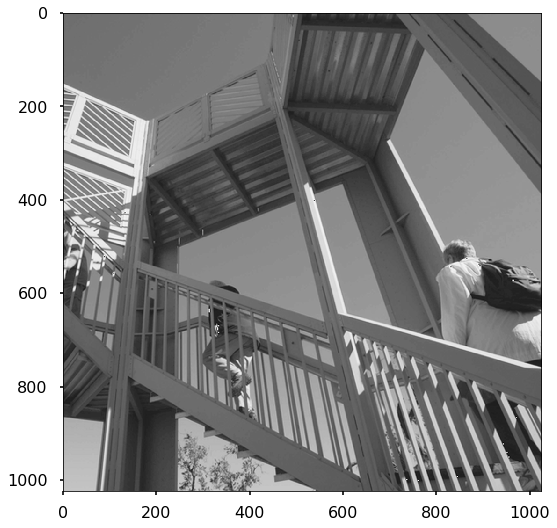

In [9]:
zoom2linearspline = scipy.ndimage.zoom(original, 2.0, order = 2)
plt.imshow(zoom2linearspline)
plt.show()

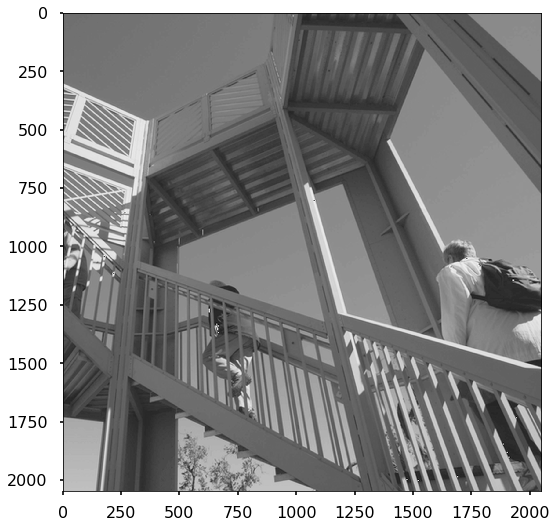

In [10]:
zoom4linearspline = scipy.ndimage.zoom(original, 4.0, order = 3)
plt.imshow(zoom4linearspline)
plt.show()

### D.

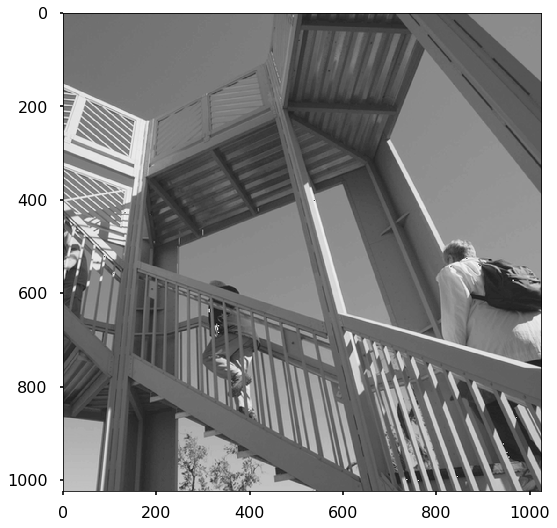

In [11]:
zoom2cubic = scipy.ndimage.zoom(original, 2.0, order = 3)
plt.imshow(zoom2cubic)
plt.show()

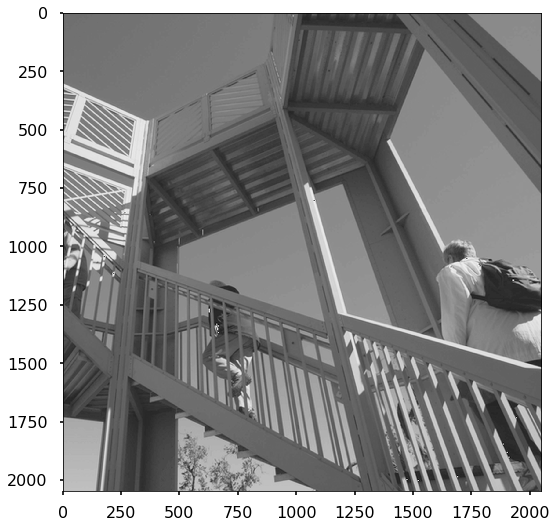

In [12]:
zoom4cubic = scipy.ndimage.zoom(original, 4.0, order = 3)
plt.imshow(zoom4cubic)
plt.show()

## Question 3

### A.

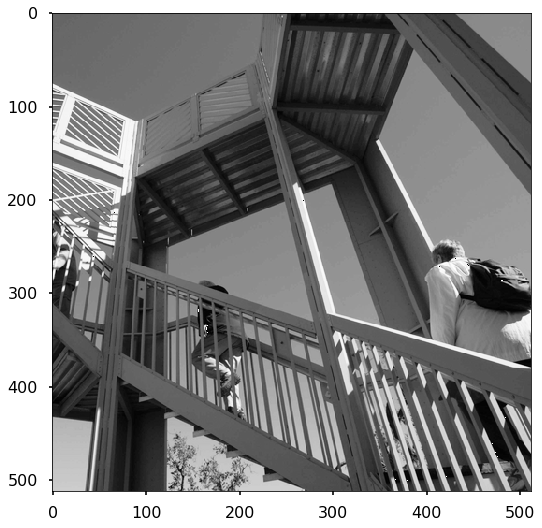

In [13]:
plt.imshow(misc.ascent())
plt.show()

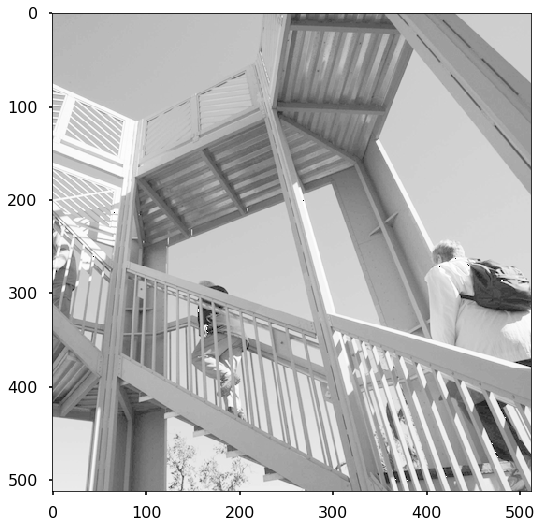

In [14]:
gamma = 255 * (original / 255) ** (1 / 2.2)
plt.imshow(gamma)
plt.show()

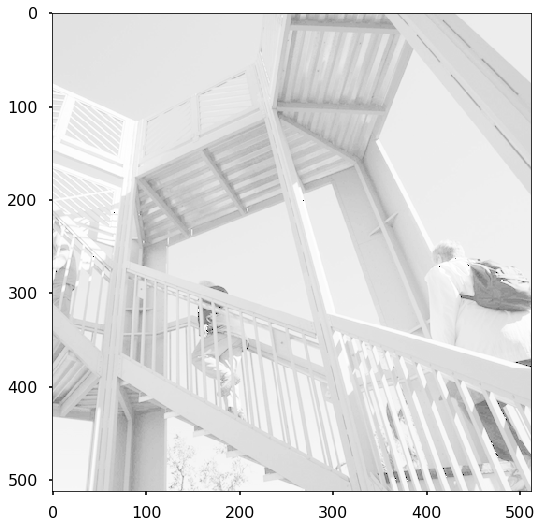

In [15]:
gamma2 = 255 * (original / 255) ** (1 / 5)
plt.imshow(gamma2)
plt.show()

### B.

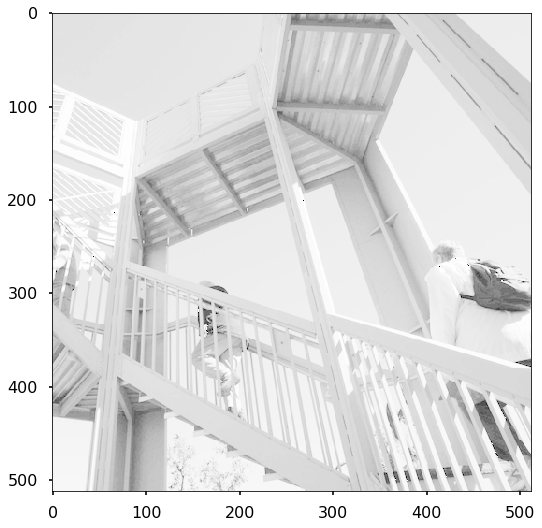

In [16]:
log10 = np.log10(original + 1)
plt.imshow(log10)
plt.show()

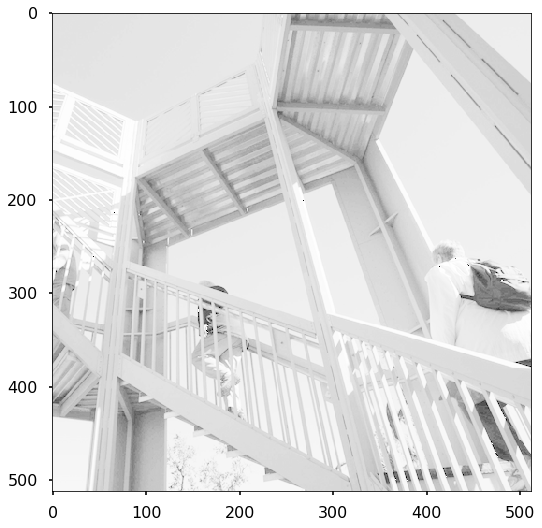

In [17]:
logE = np.log(original + 1)
plt.imshow(logE)
plt.show()

## Question 4

Low contrast image retrieved from https://hhsrop.files.wordpress.com/2014/11/low-contrast-ex-02.png

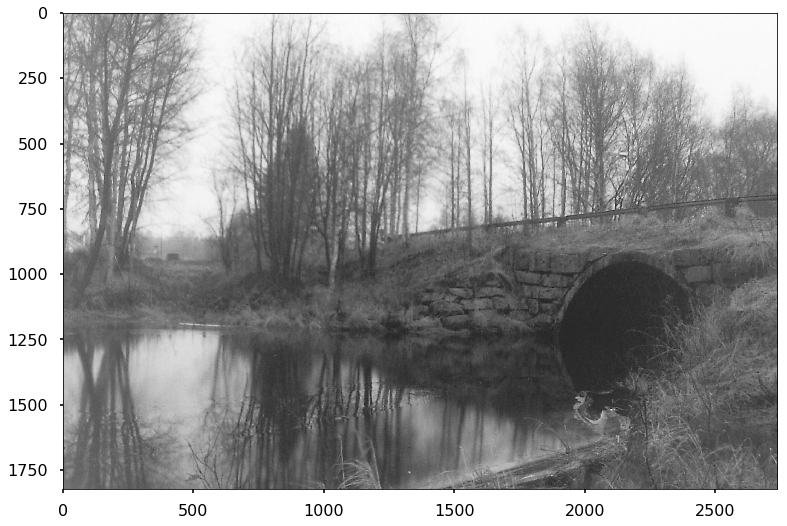

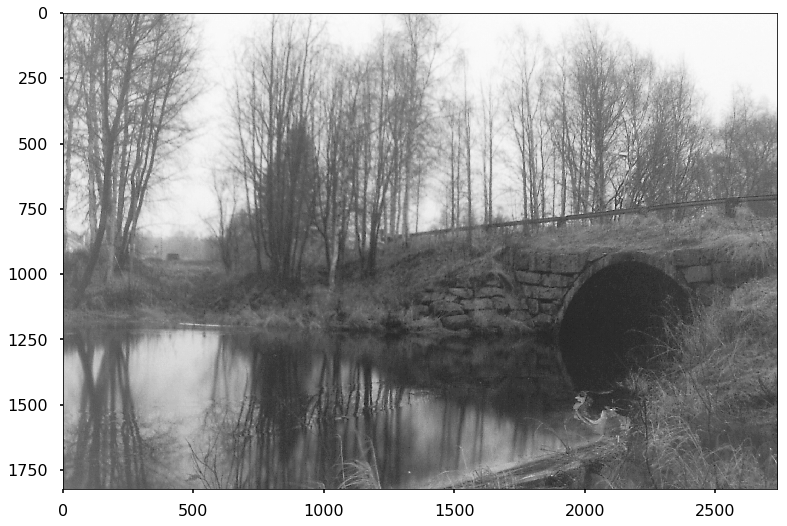

In [18]:
lowcontrast = imageio.imread('https://hhsrop.files.wordpress.com/2014/11/low-contrast-ex-02.png')
plt.imshow(lowcontrast)
plt.show()
low = np.min(lowcontrast)
high = np.max(lowcontrast)
r = high - low
for p in np.nditer(lowcontrast, op_flags = ['readwrite']):
    p[...] = (p - low) * (255 / r)
plt.imshow(lowcontrast)
plt.show()

## Question 5

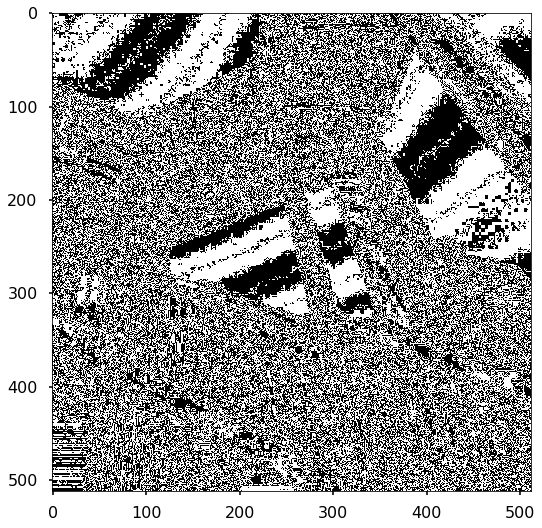

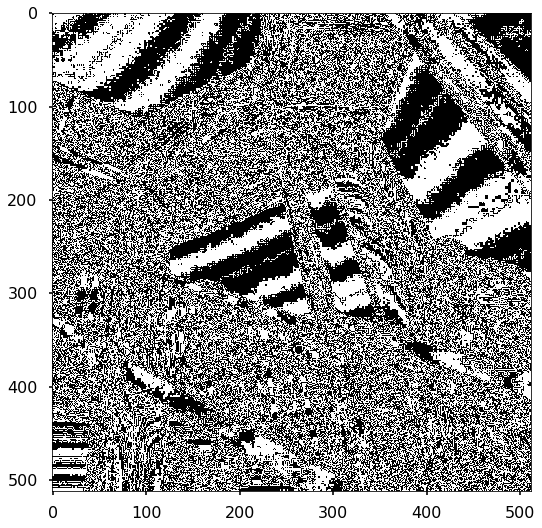

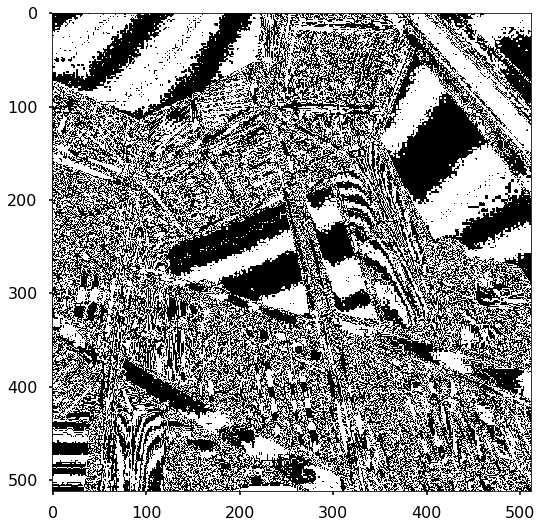

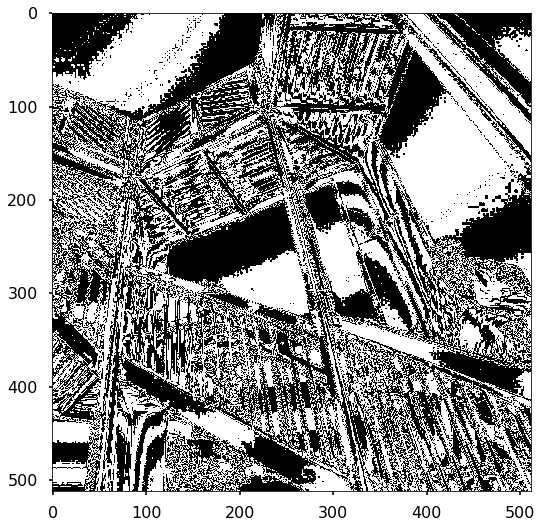

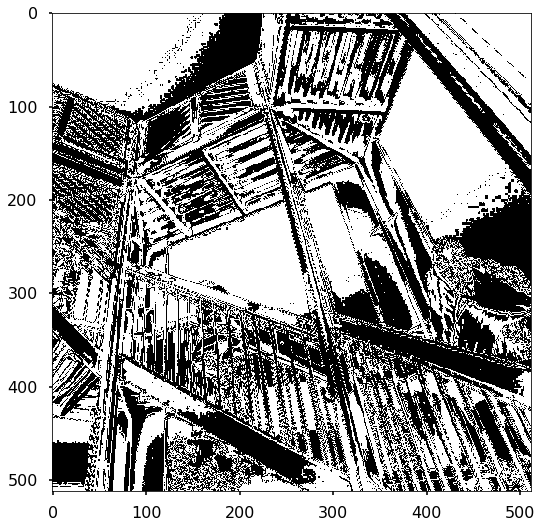

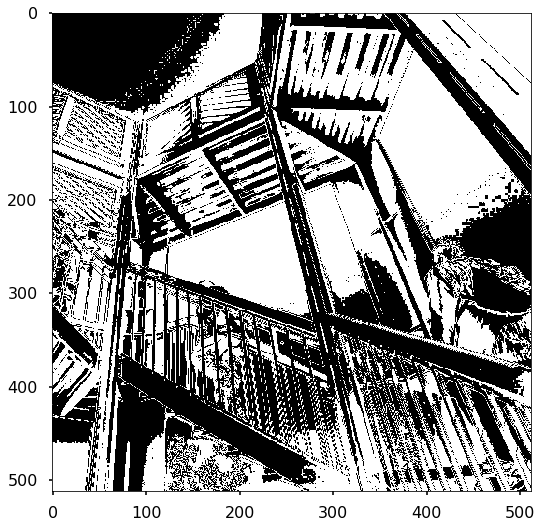

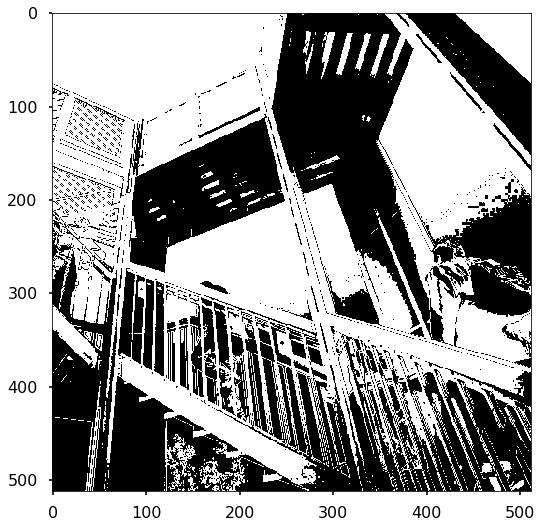

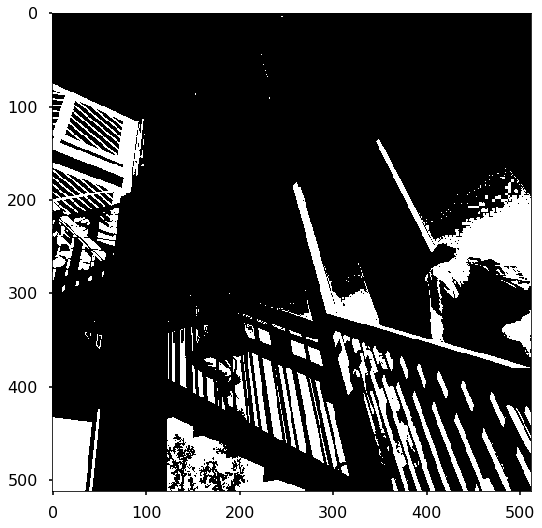

In [19]:
slices = []

for bit in range(8):
    byteMatrix = np.copy(original)
    n = 2 ** bit

    for byte in np.nditer(byteMatrix, op_flags = ['readwrite']):
        byte[...] = byte & n
    plt.imshow(byteMatrix.astype('uint8'))
    plt.show()
    slices.append(byteMatrix)

## Question 6

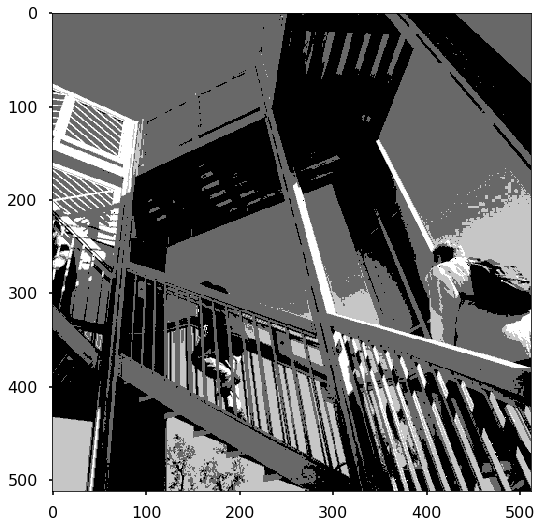

In [20]:
plt.imshow(slices[7] + slices[6])
plt.show()

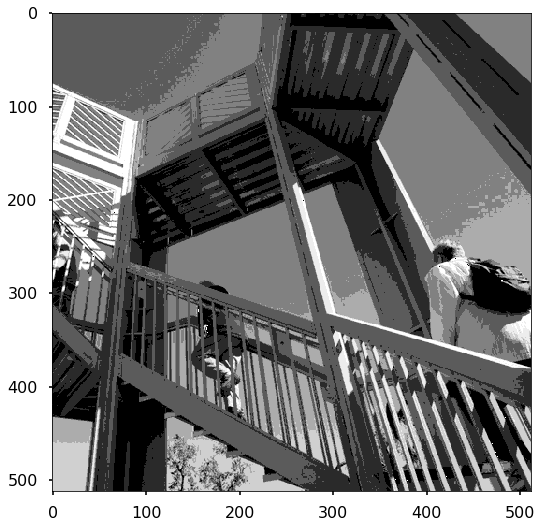

In [21]:
plt.imshow(slices[7] + slices[6] + slices[5])
plt.show()

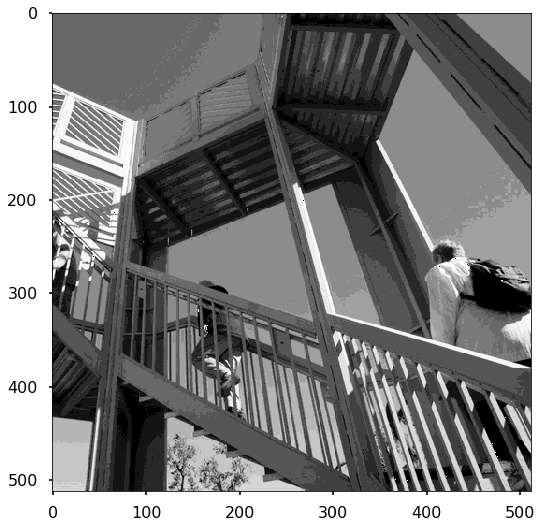

In [22]:
plt.imshow(slices[7] + slices[6] + slices[5] + slices[4])
plt.show()

## Question 7

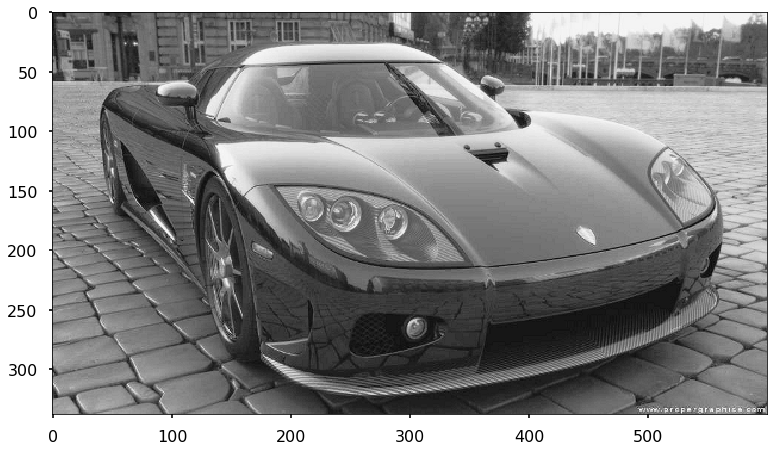

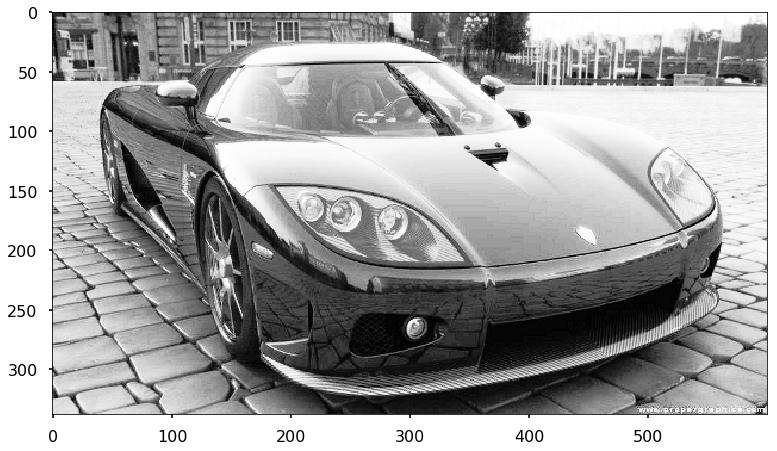

In [23]:
image = imageio.imread('https://i.stack.imgur.com/PgaNb.png')
plt.imshow(image)
plt.show()

image_histogram, bins = np.histogram(image, 256, normed = True)
cdf = image_histogram.cumsum()
cdf = 255 * cdf / cdf[-1]

image_equalized = np.interp(image, bins[:-1], cdf)

plt.imshow(image_equalized)
plt.show()

## Question 8

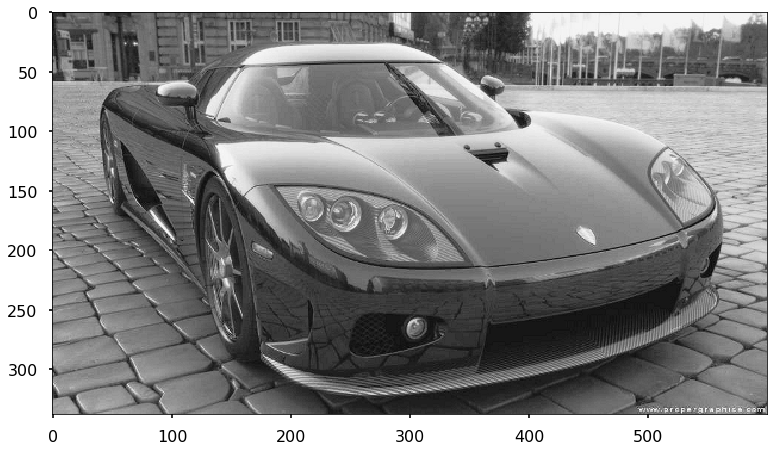

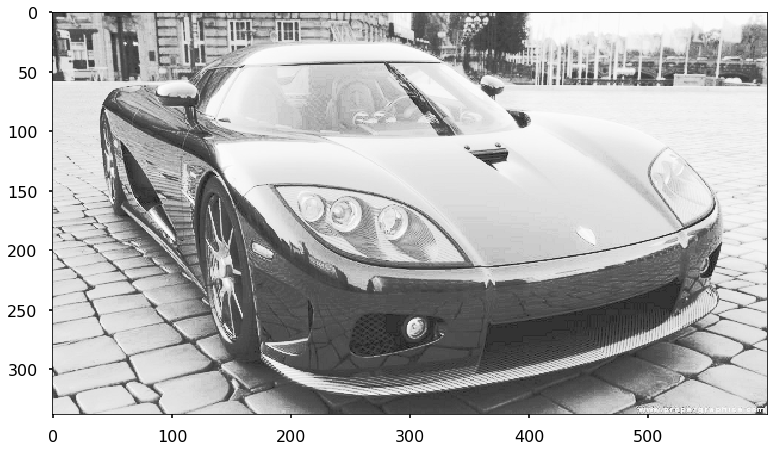

In [24]:
image = imageio.imread('https://i.stack.imgur.com/PgaNb.png')
plt.imshow(image)
plt.show()

## Produce target histogram from some other image
image_histogram, bins = np.histogram(original, 256, normed = True)
cdf = image_histogram.cumsum()
cdf = 255 * cdf / cdf[-1]

image_equalized = np.interp(image, bins[:-1], cdf)

plt.imshow(image_equalized)
plt.show()

## Question 9

In [25]:
def laplacian_mask(n):
    if (n % 2 == 0):
        return None
    mask = np.ones((n, n));
    mask[math.floor(n / 2), math.floor(n / 2)] = 1 - n ** 2;
    return mask

### 3x3 Laplacian

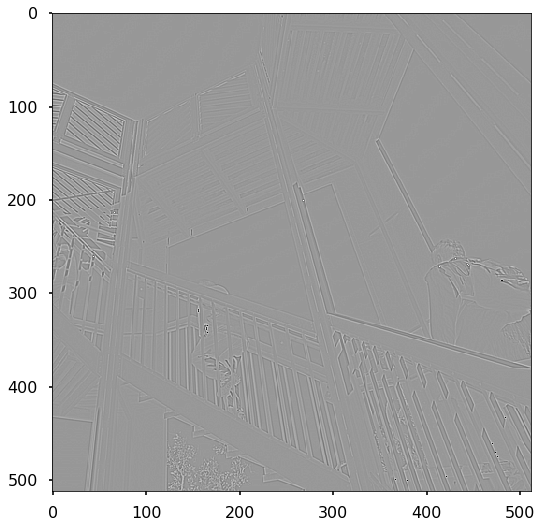

In [26]:
result = scipy.ndimage.filters.convolve(original, laplacian_mask(3))
plt.imshow(result)
plt.show()

### 5x5 Laplacian

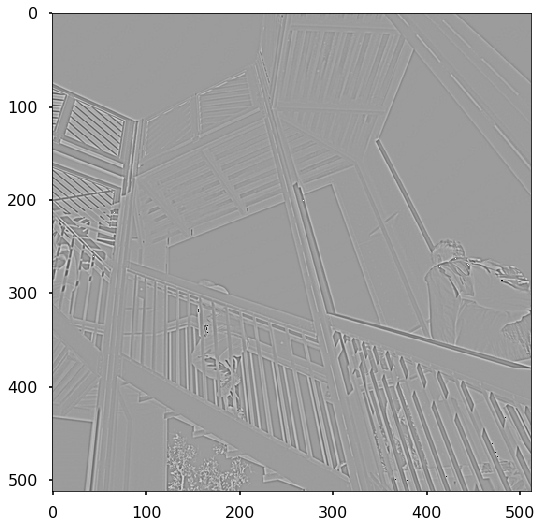

In [27]:
result = scipy.ndimage.filters.convolve(original, laplacian_mask(5))
plt.imshow(result)
plt.show()

## Question 10

In [28]:
log3x3 = [[0.0321, -0.0124, 0.0321], [-0.0124, -0.0787, -0.0124], [0.0321, -0.0124, 0.0321]]
log5x5 = [[0.0255, 0.0199, 0.0133, 0.0199, 0.0255], [0.0199, -0.0155, -0.0425, -0.0155, 0.0199], 
          [0.0133, -0.0425, -0.0828, -0.0425, 0.0133], [0.0199, -0.0155, -0.0425, -0.0155, 0.0199],
          [0.0255, 0.0199, 0.0133, 0.0199, 0.0255]]

### 3x3 Laplacian of Gaussian

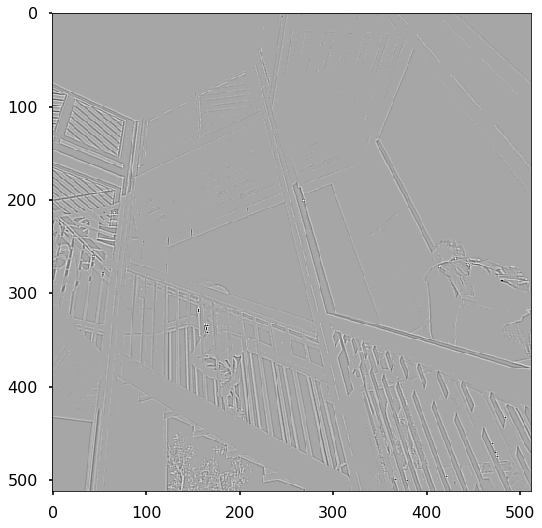

In [29]:
result = scipy.ndimage.filters.convolve(original, log3x3)
plt.imshow(result)
plt.show()

### 5x5 Laplacian of Gaussian

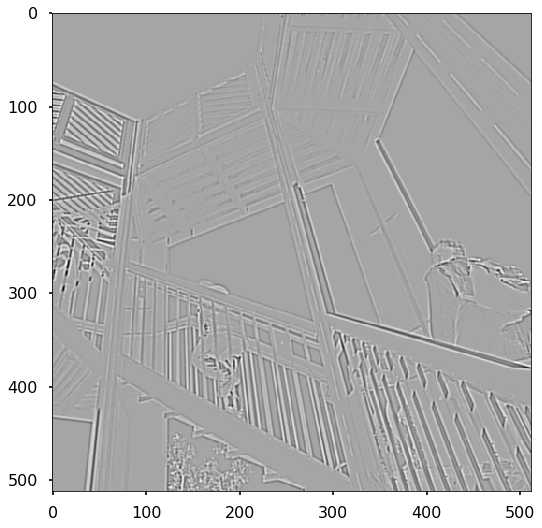

In [30]:
result = scipy.ndimage.filters.convolve(original, log5x5)
plt.imshow(result)
plt.show()

## Question 11

### Arithmetic

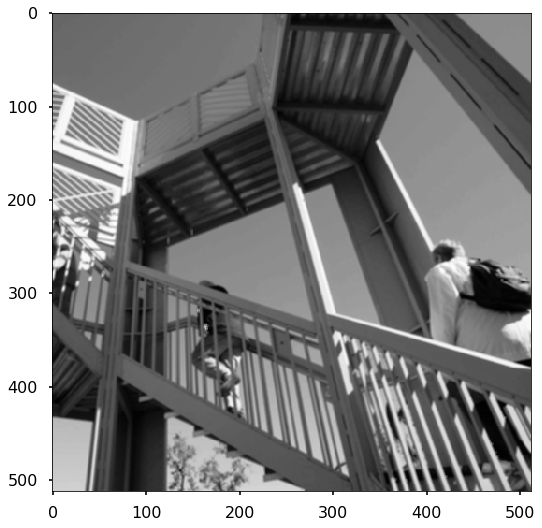

In [31]:
mean = scipy.ndimage.filters.convolve(original, np.full((3, 3), 1.0 / 9))
plt.imshow(mean)
plt.show()

### Geometric

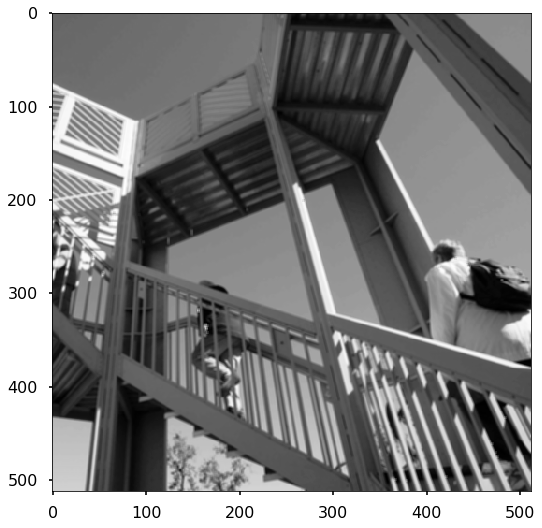

In [32]:
geo = scipy.ndimage.filters.convolve(original, np.full((3, 3), (1.0 / 9) ** (1 / 9.0)))
plt.imshow(geo)
plt.show()

### Median

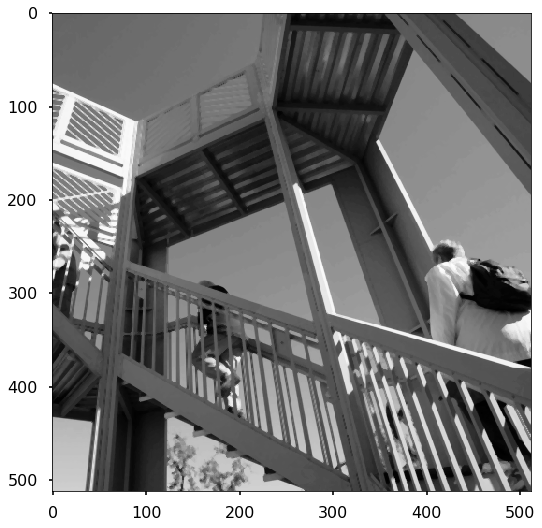

In [33]:
median = scipy.ndimage.filters.median_filter(original, (3, 3))
plt.imshow(median)
plt.show()

## Question 12

### Sobel

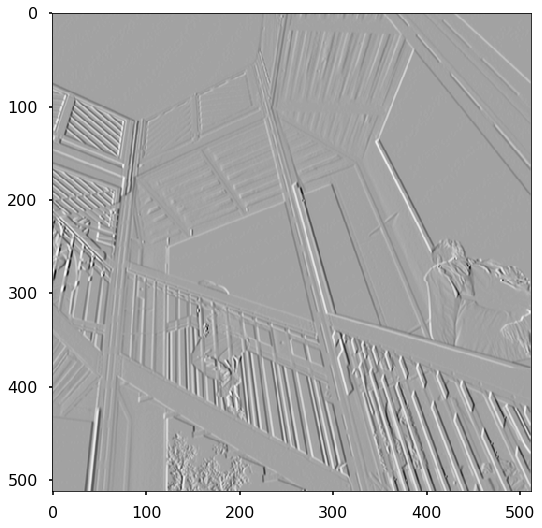

In [34]:
sobel = scipy.ndimage.filters.sobel(original)
plt.imshow(sobel)
plt.show()

### Prewitt

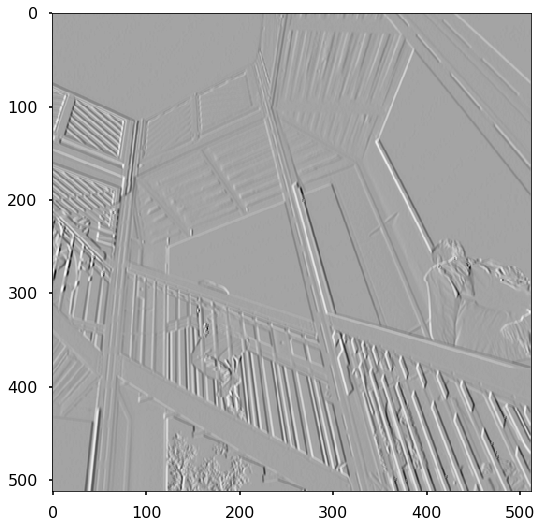

In [35]:
prewitt = scipy.ndimage.filters.prewitt(original)
plt.imshow(prewitt)
plt.show()

### Roberts

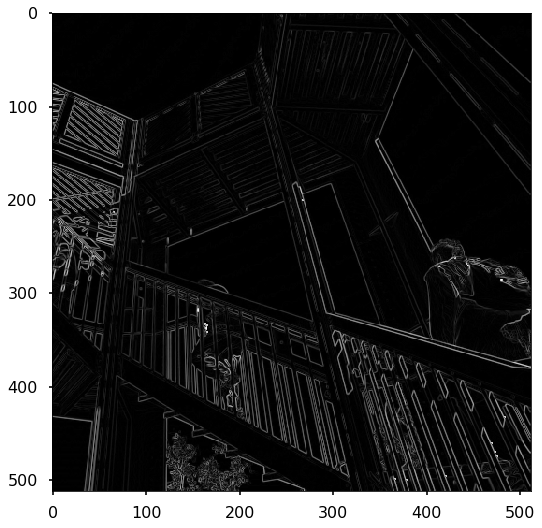

In [36]:
k1 = [[1, 0], [0, -1]]
k2 = [[0, 1], [-1, 0]]
roberts1 = scipy.ndimage.filters.convolve(original, k1)
roberts2 = scipy.ndimage.filters.convolve(original, k2)
roberts = np.sqrt((roberts1 ** 2) + (roberts2 ** 2))
plt.imshow(roberts)
plt.show()

### Canny

I attempted to do this by implementing the algorithm, but non-maximum supression is beyond me. The code below is what could understand:

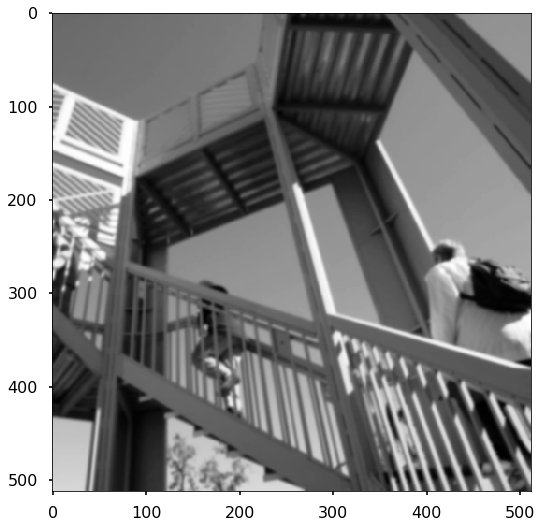

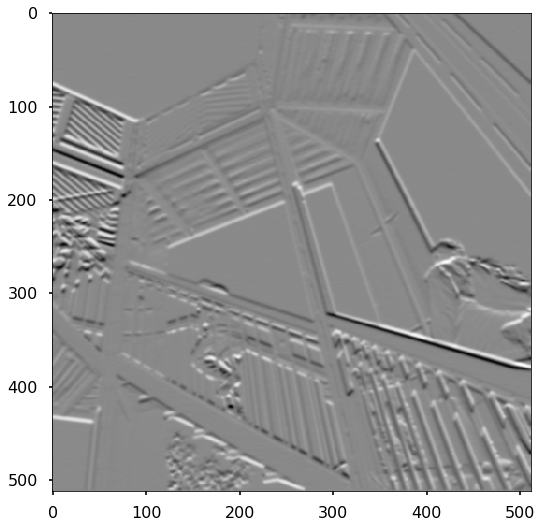

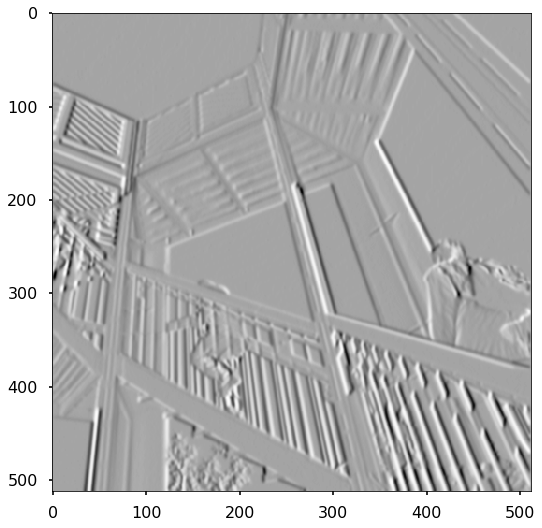

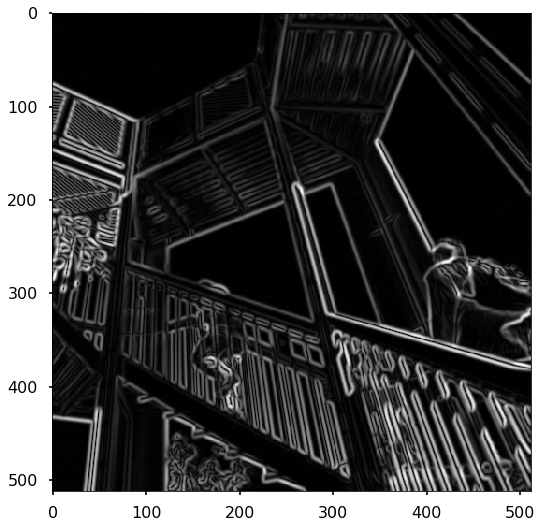

In [38]:
## Apply Gaussian filter
blurred = scipy.ndimage.filters.gaussian_filter(original, 1.4)
plt.imshow(blurred)
plt.show()

## Apply Sobel on each axis
sobel_x = scipy.ndimage.filters.sobel(blurred, 0)
plt.imshow(sobel_x)
plt.show()
sobel_y = scipy.ndimage.filters.sobel(blurred, 1)
plt.imshow(sobel_y)
plt.show()

## Calculate angle and magnitude of gradients
magnitude = np.sqrt(sobel_x ** 2 + sobel_y ** 2)
plt.imshow(magnitude)
plt.show()

Canny edge detector module of SciKit Image:

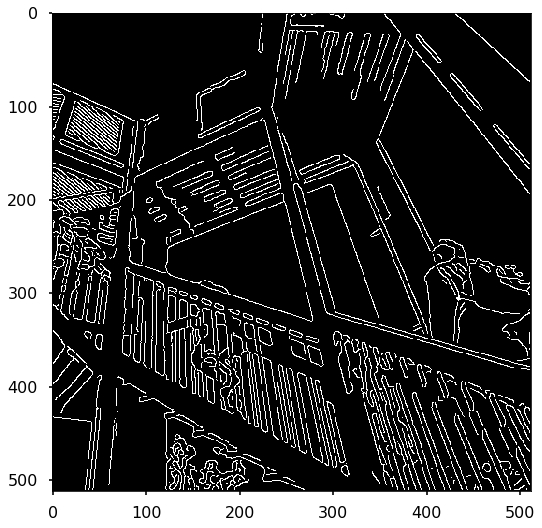

In [37]:
cannyedge = feature.canny(original, sigma = 1.6, high_threshold = 50, low_threshold = 20,)
plt.imshow(cannyedge)
plt.show()